# Car Price prediction 2

## Прогнозирование стоимости автомобиля по характеристикам

## В рамках проекта сделаем следующее:
* Построим "наивную"/baseline модель, предсказывающую цену по модели и году выпуска (с ней будем сравнивать другие модели)
* Обработаем и отнормируем признаки
* Сделаем первую модель на основе градиентного бустинга с помощью CatBoost
* Сделаем вторую модель на основе нейронных сетей и сравним результаты
* Сделаем multi-input нейронную сеть для анализа табличных данных и текста одновременно
* Добавим в multi-input сеть обработку изображений
* Осуществим ансамблирование градиентного бустинга и нейронной сети (усреднение их предсказаний)

In [6]:
# загружаем и распаковываем датасет
from google.colab import drive
drive.mount('/content/drive')
# архив с данными Kaggle
!cp "/content/drive/My Drive/data/pr6/car2.zip" /content 
!unzip -q car2.zip -d .
# дополнительный файл со стоп-словами
!cp "/content/drive/My Drive/data/pr6/stopnew.txt" /content 

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
replace ./img/img/1001403361.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [7]:
!nvidia-smi

Wed Dec  2 12:00:42 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P8    26W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [8]:
!pip install -q --upgrade pip
!pip install -q tensorflow==2.3
!pip install -q catboost
!pip install -q albumentations
!pip install -q pymorphy2
!pip install -U pymorphy2-dicts-ru


In [9]:
# загружаем необходимые библиотеки
import random
import numpy as np 
import pandas as pd 
import pymorphy2
import os
import sys
import PIL
import cv2
import re

# catboost
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# keras
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import albumentations

# plt
import matplotlib.pyplot as plt
# увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
# графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline

In [10]:
# контроль версий
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)
print('Pandas       :', pd.__version__)
print('Tensorflow   :', tf.__version__)

Python       : 3.6.9 (default, Oct  8 2020, 12:12:24) 
Numpy        : 1.18.5
Pandas       : 1.1.4
Tensorflow   : 2.3.0


In [11]:
# определяем функцию MAPE
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [12]:
# фиксируем RANDOM_SEED
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

In [13]:
!pip freeze > requirements.txt

# DATA

Посмотрим на типы признаков:

* bodyType - категориальный
* brand - категориальный
* color - категориальный
* description - текстовый
* engineDisplacement - числовой, представленный как текст
* enginePower - числовой, представленный как текст
* fuelType - категориальный
* mileage - числовой
* modelDate - числовой
* model_info - категориальный
* name - категориальный, желательно сократить размерность
* numberOfDoors - категориальный
* price - числовой, целевой
* productionDate - числовой
* sell_id - изображение (файл доступен по адресу, основанному на sell_id)
* vehicleConfiguration - не используется (комбинация других столбцов)
* vehicleTransmission - категориальный
* Владельцы - категориальный
* Владение - числовой, представленный как текст
* ПТС - категориальный
* Привод - категориальный
* Руль - категориальный

In [14]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
sample_submission = pd.read_csv('sample_submission.csv')

In [15]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6682 entries, 0 to 6681
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              6682 non-null   object 
 1   brand                 6682 non-null   object 
 2   color                 6682 non-null   object 
 3   description           6682 non-null   object 
 4   engineDisplacement    6682 non-null   object 
 5   enginePower           6682 non-null   object 
 6   fuelType              6682 non-null   object 
 7   mileage               6682 non-null   int64  
 8   modelDate             6682 non-null   int64  
 9   model_info            6682 non-null   object 
 10  name                  6682 non-null   object 
 11  numberOfDoors         6682 non-null   int64  
 12  price                 6682 non-null   float64
 13  productionDate        6682 non-null   int64  
 14  sell_id               6682 non-null   int64  
 15  vehicleConfiguration 

In [11]:
train.describe()

,mileage,modelDate,numberOfDoors,price,productionDate,sell_id
count,6682.000000,6682.000000,6682.000000,6.682000e+03,6682.000000,6.682000e+03
mean,120522.610895,2010.135588,4.268482,1.899868e+06,2012.031577,1.096589e+09
std,81454.448294,5.370973,0.878687,1.914153e+06,5.049676,2.653747e+07
min,1.000000,1975.000000,2.000000,3.013010e+05,1982.000000,3.421294e+07
25%,59181.250000,2007.000000,4.000000,8.000000e+05,2009.000000,1.097102e+09
50%,111000.000000,2011.000000,4.000000,1.300000e+06,2013.000000,1.099407e+09
75%,168000.000000,2014.000000,5.000000,2.299283e+06,2016.000000,1.099973e+09
max,999999.000000,2019.000000,5.000000,2.390000e+07,2020.000000,1.100273e+09


In [12]:
train.nunique()

bodyType                  17
brand                      3
color                     16
description             6147
engineDisplacement        48
enginePower              146
fuelType                   4
mileage                 2900
modelDate                 41
model_info               118
name                     900
numberOfDoors              4
price                   1628
productionDate            38
sell_id                 6682
vehicleConfiguration     288
vehicleTransmission        4
Владельцы                  3
Владение                 173
ПТС                        2
Привод                     3
Руль                       2
dtype: int64

# Model 1: Создадим "наивную" модель 
Эта модель будет предсказывать среднюю цену по модели и году выпуска. 
C ней будем сравнивать другие модели.



In [16]:
# split данных
data_train, data_test = train_test_split(
    train, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

In [17]:
# Наивная модель
predicts = []
for index, row in pd.DataFrame(data_test[['model_info', 
                                          'productionDate']]).iterrows():
    query = f"model_info == '{row[0]}' and productionDate == '{row[1]}'"
    predicts.append(data_train.query(query)['price'].median())

# заполним не найденные совпадения
predicts = pd.DataFrame(predicts)
predicts = predicts.fillna(predicts.median())

# округлим
predicts = (predicts // 1000) * 1000

# оцениваем точность
print(
    f"MAPE: {(mape(data_test['price'], predicts.values[:, 0]))*100: 0.2f} %")

MAPE:  19.88 %


# EDA

→ EDA

Датасет очищен от дубликатов, пропущенных значений, обработаны выбросы.
Подобраны новые переменные, выполнена нормализация и стандартизация признаков, применены методы для кодирования категориальных признаков.
Произведена генерация и отбор признаков.

Используем Pandas Profiling для анализа данных.

In [ ]:
# !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
# import numpy as np
# import pandas as pd
# from pandas_profiling import ProfileReport

In [ ]:
# eda_report = ProfileReport(train,
#                            title='Pandas Profiling Report',
#                            html={'style': {'full_width': True}})

In [ ]:
# eda_report.to_file("eda_file.html")
# eda_report.to_notebook_iframe()

###Выводы по EDA:
* Признаки (productionDate, modelDate) скоррелированы. Оставим признаки productionDate.
* В признаке "Владение" пропущено 64.7% значений. Признак можно удалить
* Признак "Руль" - более 99% одинаковых значений. Признак можно удалить 

Посмотрим, как выглядят распределения числовых признаков:

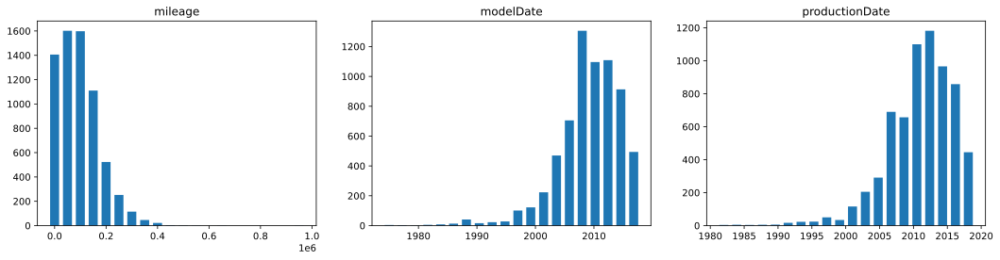

In [18]:
# распределения числовых признаков
def visualize_distributions(titles_values_dict):
    columns = min(3, len(titles_values_dict))
    rows = (len(titles_values_dict) - 1) // columns + 1
    fig = plt.figure(figsize=(columns * 6, rows * 4))
    for i, (title, values) in enumerate(titles_values_dict.items()):
        hist, bins = np.histogram(values, bins=20)
        ax = fig.add_subplot(rows, columns, i + 1)
        ax.bar(bins[:-1], hist, width=(bins[1] - bins[0]) * 0.7)
        ax.set_title(title)
    plt.show()


visualize_distributions({
    'mileage': train['mileage'].dropna(),
    'modelDate': train['modelDate'].dropna(),
    'productionDate': train['productionDate'].dropna()
})

###Вывод по анализу распределения:
CatBoost сможет работать с признаками и в таком виде, но для нейросети нужны нормированные данные.

In [438]:
# логарифмирование целевого признака 'price' приводит к фантастическим резульататам
# MAPE порядка 8-9 но при загрузке результатов на Kaggle получается увы ... те же 14
# поэтому от данной операции я отказался

# train["price"] = np.log1p(train["price"])

# PreProc Tabular Data

In [19]:
# объединяем трейн и тест в один датасет
train['sample'] = 1  # помечаем где у нас трейн
test['sample'] = 0  # помечаем где у нас тест
test['price'] = 0  # price заполняем нулями

data = test.append(train, sort=False).reset_index(drop=True)
print(train.shape, test.shape, data.shape)

(6682, 23) (1671, 23) (8353, 23)


In [20]:
# удалим дубликаты (если они есть, хотя их нет):
data.drop_duplicates()

,bodyType,brand,color,description,engineDisplacement,enginePower,fuelType,mileage,modelDate,model_info,name,numberOfDoors,productionDate,sell_id,vehicleConfiguration,vehicleTransmission,Владельцы,Владение,ПТС,Привод,Руль,sample,price
0,универсал 5 дв.,MERCEDES,чёрный,Всем привет!\n\nПродам эксклюзивный проект 124...,3.0 LTR,220 N12,бензин,350000,1984,W124,300 3.0 AT (220 л.с.),5,1991,1099427284,WAGON_5_DOORS AUTOMATIC 3.0,автоматическая,3 или более,6 лет и 3 месяца,Оригинал,задний,Левый,0,0.0
1,купе,BMW,белый,Продаю любимейшую тачилу.. Обвес и тюнинг Hamm...,3.0 LTR,313 N12,дизель,15000,2011,6ER,640d xDrive 3.0d AT (313 л.с.) 4WD,2,2013,1096405886,COUPE AUTOMATIC 3.0,автоматическая,1 владелец,6 лет и 6 месяцев,Оригинал,полный,Левый,0,0.0
2,купе,BMW,пурпурный,"Машина тут продаётся не в первый раз, НО! Толь...",2.5 LTR,218 N12,бензин,166600,2005,3ER,325xi 2.5 AT (218 л.с.) 4WD,2,2008,1100195294,COUPE AUTOMATIC 2.5,автоматическая,3 или более,NaN,Оригинал,полный,Левый,0,0.0
3,седан,BMW,белый,"Автомобиль в отличном состоянии, весь в родной...",2.0 LTR,136 N12,бензин,147000,2005,3ER,318i 2.0 AT (136 л.с.),4,2007,1099827282,SEDAN AUTOMATIC 2.0,автоматическая,2 владельца,NaN,Оригинал,задний,Левый,0,0.0
4,седан,BMW,чёрный,Немка! с бесключивым доступом и камерой заднег...,2.0 LTR,190 N12,дизель,24000,2016,5ER,520d xDrive 2.0d AT (190 л.с.) 4WD,4,2019,1100076198,SEDAN AUTOMATIC 2.0,автоматическая,1 владелец,NaN,Оригинал,полный,Левый,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8348,седан,BMW,серый,Продаётся любимый автомобиль! За годы эксплуат...,2.0 LTR,150 N12,бензин,232777,2005,3ER,320i 2.0 AT (150 л.с.),4,2006,1100036650,SEDAN AUTOMATIC 2.0,автоматическая,3 или более,NaN,Оригинал,задний,Левый,1,550000.0
8349,седан,BMW,чёрный,Куплена у официального дилера в 2017 г. \n\nТр...,2.0 LTR,190 N12,дизель,33700,2013,5ER,520d 2.0d AT (190 л.с.),4,2016,1090506038,SEDAN AUTOMATIC 2.0,автоматическая,3 или более,2 года и 2 месяца,Оригинал,задний,Левый,1,1900000.0
8350,седан,BMW,белый,Торг на месте. Все работает. Сборка немецкая. ...,2.0 LTR,143 N12,бензин,200000,2008,3ER,318i 2.0 AT (143 л.с.),4,2008,1095155628,SEDAN AUTOMATIC 2.0,автоматическая,3 или более,2 года и 2 месяца,Оригинал,задний,Левый,1,530000.0
8351,седан,AUDI,чёрный,Автомобиль в отличном состоянии.\n3-из Авто в ...,3.0 LTR,310 N12,бензин,72000,2013,A8,Long 3.0 AT (310 л.с.) 4WD,4,2016,1099625256,SEDAN AUTOMATIC 3.0,автоматическая,3 или более,NaN,Оригинал,полный,Левый,1,1970000.0


In [21]:
# делаем копию оригинальной базы
df_output = data.copy()
data_origin = data.copy()

In [22]:
# удаляем ненужные признаки
df_output.drop(['description', 'sell_id', 'Владение', 'modelDate',
                'vehicleTransmission'], axis=1, inplace=True)

# переименуем признаки для удобства
df_output = df_output.rename(
    columns={'Руль': 'wheel', 'Владельцы': 'owners', 
             'Привод': 'gear', 'ПТС': 'pts'})

# преобразуем 'enginePower', оставим только цифру
df_output['enginePower'] = df_output['enginePower'].apply(
    lambda x: int(x.split()[0]))

# преобразуем 'engineDisplacement', оставим только цифру
df_output['engineDisplacement'][df_output['engineDisplacement']
                                == 'undefined LTR'] = 'NaN'
df_output['engineDisplacement'] = df_output['engineDisplacement'].apply(
    lambda x: float(x.split()[0]))

# заполним пропуск в 'engineDisplacement'
df_output['engineDisplacement'].fillna(
    df_output['engineDisplacement'].median(), inplace=True)

# в признаке 'bodyType'	оставим только тип кузова
df_output['bodyType'] = df_output['bodyType'].apply(lambda x: x.split()[0])

# преобразуем признак 'owners' в числовые данные и заполним пропуски


def owning(x):
    if x == '1\xa0владелец':
        return 1
    if x == '2\xa0владельца':
        return 2
    if x == '3 или более':
        return 3


df_output['owners'] = df_output['owners'].apply(owning)
df_output['owners'].fillna(df_output['owners'].median(), inplace=True)
df_output['owners'] = df_output['owners'].astype(int)

# из признака 'vehicleConfiguration' оставим только второй элемент - тип трансмиссии
df_output['vehicleConfiguration'] = df_output['vehicleConfiguration'].apply(
    lambda x: x.split()[1])

# выделяем из 'name' признак  xDrive
# признак 'xdrive' - наличие xDrive в названии


def name_f1(nm):
    name_set = nm.split()
    for i in name_set:
        if i == 'xDrive':
            x = 1
            break
        else:
            x = 0
    return x


df_output['xDrive'] = df_output['name'].apply(name_f1)

# из признака 'name' оставим только первый элемент
df_output['name'] = df_output['name'].apply(lambda x: x.split()[0])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()


In [23]:
# вводим признак 'tax' - расчет годового налога:
df_output['tax'] = df_output.enginePower.apply(lambda x: x*12 if x <= 100
                                               else x*25 if x > 100 and x <= 125
                                               else x*35 if x > 125 and x <= 150
                                               else x*45 if x > 150 and x <= 175
                                               else x*55 if x > 175 and x <= 200
                                               else x*65 if x > 200 and x <= 225
                                               else x*75 if x > 225 and x <= 250
                                               else x*150)
# прологарифмируем признак 'tax'
df_output['tax'] = np.log1p(df_output['tax'])

# вводим признак "tax_cat" - категории налога по мощности автомобиля
df_output['tax_cat'] = df_output.enginePower.apply(lambda x: 1 if x <= 100
                                                   else 2 if x > 100 and x <= 125
                                                   else 3 if x > 125 and x <= 150
                                                   else 4 if x > 150 and x <= 175
                                                   else 5 if x > 175 and x <= 200
                                                   else 6 if x > 200 and x <= 225
                                                   else 7 if x > 225 and x <= 250
                                                   else 8)
df_output['tax_cat'] = df_output['tax_cat'].astype(str)

In [24]:
# создадим новый признак 'mileDate' и прологарифмируем его
df_output['mileDate'] = (df_output['mileage'] /
                         (2021-df_output['productionDate']))
df_output['mileDate'] = np.log1p(df_output['mileDate'])

# прологарифмируем признак 'productionDate'
df_output['productionDate'] = np.log1p(2021 - df_output['productionDate'])

# прологарифмируем признак 'tax'
df_output['tax'] = np.log1p(df_output['tax'])

# прологарифмируем признак 'mileage'
df_output['mileage'] = np.log1p(df_output['mileage'])

# прологарифмируем признак 'enginePower'
df_output['enginePower'] = np.log1p(df_output['enginePower'])

In [25]:
df_output['numberOfDoors'] = df_output['numberOfDoors'].astype(str)
df_output['xDrive'] = df_output['xDrive'].astype(str)

In [26]:
# проверка на пропуски
df_output.isna().sum()

bodyType                0
brand                   0
color                   0
engineDisplacement      0
enginePower             0
fuelType                0
mileage                 0
model_info              0
name                    0
numberOfDoors           0
productionDate          0
vehicleConfiguration    0
owners                  0
pts                     0
gear                    0
wheel                   0
sample                  0
price                   0
xDrive                  0
tax                     0
tax_cat                 0
mileDate                0
dtype: int64

In [27]:
df_output.columns

Index(['bodyType', 'brand', 'color', 'engineDisplacement', 'enginePower',
       'fuelType', 'mileage', 'model_info', 'name', 'numberOfDoors',
       'productionDate', 'vehicleConfiguration', 'owners', 'pts', 'gear',
       'wheel', 'sample', 'price', 'xDrive', 'tax', 'tax_cat', 'mileDate'],
      dtype='object')

In [28]:
df_output.corr()

,engineDisplacement,enginePower,mileage,productionDate,owners,sample,price,tax,mileDate
engineDisplacement,1.000000,0.859374,0.011519,0.192557,0.120609,0.009093,0.241359,0.813295,-0.110275
enginePower,0.859374,1.000000,-0.146824,-0.070133,-0.009144,0.002639,0.372762,0.965036,-0.155468
mileage,0.011519,-0.146824,1.000000,0.698915,0.426049,-0.001522,-0.557616,-0.093274,0.885457
productionDate,0.192557,-0.070133,0.698915,1.000000,0.563666,-0.003085,-0.504323,-0.016512,0.287656
owners,0.120609,-0.009144,0.426049,0.563666,1.000000,-0.003950,-0.309090,0.020306,0.206022
sample,0.009093,0.002639,-0.001522,-0.003085,-0.003950,1.000000,0.405771,0.003280,-0.000095
price,0.241359,0.372762,-0.557616,-0.504323,-0.309090,0.405771,1.000000,0.301636,-0.419883
tax,0.813295,0.965036,-0.093274,-0.016512,0.020306,0.003280,0.301636,1.000000,-0.117820
mileDate,-0.110275,-0.155468,0.885457,0.287656,0.206022,-0.000095,-0.419883,-0.117820,1.000000


In [29]:
# удаляем 'mileDate' из-за сильной корреляции с 'mileage'
# удаляем 'name' - практика доказал его негативное влияние на результат
df_output.drop(['mileDate', 'name'], axis=1, inplace=True)

In [30]:
categorical_features = ['bodyType',
                        'brand',
                        'color',
                        'fuelType',
                        'model_info',
                        'numberOfDoors',
                        'vehicleConfiguration',
                        'owners',
                        'pts',
                        'gear',
                        'wheel',
                        'xDrive',
                        'tax_cat'
                        ]

numerical_features = ['engineDisplacement',
                      'enginePower',
                      'productionDate',
                      'mileage',
                      'tax'
                      ]

In [31]:
# нормализуем данные
scaler = MinMaxScaler()
for x in numerical_features:
    df_output[x] = scaler.fit_transform(df_output[[x]])[:, 0]

In [32]:
# Label Encoding
for column in categorical_features:
    df_output[column] = df_output[column].astype('category').cat.codes

In [33]:
# One-Hot Encoding
df_output = pd.get_dummies(df_output, 
                           columns=categorical_features, 
                           dummy_na=False)

###Split Data

In [34]:
# выделим тестовую часть
train_data = df_output.query('sample == 1').drop(['sample'], axis=1)
test_data = df_output.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price.values
X = train_data.drop(['price'], axis=1)
X_sub = test_data.drop(['price'], axis=1)

In [35]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1671 entries, 0 to 1670
Columns: 192 entries, engineDisplacement to tax_cat_7
dtypes: float64(6), uint8(186)
memory usage: 394.9 KB


In [36]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, shuffle=True, random_state=RANDOM_SEED)

In [37]:
df_output.head()

,engineDisplacement,enginePower,mileage,productionDate,sample,price,tax,bodyType_0,bodyType_1,bodyType_2,bodyType_3,bodyType_4,bodyType_5,bodyType_6,bodyType_7,bodyType_8,bodyType_9,bodyType_10,bodyType_11,bodyType_12,brand_0,brand_1,brand_2,color_0,color_1,color_2,color_3,color_4,color_5,color_6,color_7,color_8,color_9,color_10,color_11,color_12,color_13,color_14,color_15,fuelType_0,...,model_info_110,model_info_111,model_info_112,model_info_113,model_info_114,model_info_115,model_info_116,model_info_117,model_info_118,model_info_119,model_info_120,model_info_121,numberOfDoors_0,numberOfDoors_1,numberOfDoors_2,numberOfDoors_3,vehicleConfiguration_0,vehicleConfiguration_1,vehicleConfiguration_2,vehicleConfiguration_3,owners_0,owners_1,owners_2,pts_0,pts_1,gear_0,gear_1,gear_2,wheel_0,wheel_1,xDrive_0,xDrive_1,tax_cat_0,tax_cat_1,tax_cat_2,tax_cat_3,tax_cat_4,tax_cat_5,tax_cat_6,tax_cat_7
0,0.389831,0.480440,0.919998,0.914915,0,0.0,0.637003,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
1,0.389831,0.638525,0.679963,0.502073,0,0.0,0.860911,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,1
2,0.305085,0.476348,0.863427,0.649561,0,0.0,0.635188,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0
3,0.220339,0.265215,0.853889,0.672591,0,0.0,0.406164,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0
4,0.220339,0.414777,0.715778,0.135348,0,0.0,0.573723,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0


# Model 2: CatBoostRegressor

In [38]:
%%time
model = CatBoostRegressor(iterations=20000,
                          # depth=10,
                          learning_rate=0.025,
                          random_seed=RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['RMSE', 'MAE'],
                          od_wait=700,
                          task_type='GPU',
                          )
model.fit(X_train, y_train,
          eval_set=(X_test, y_test),
          verbose_eval=200,
          use_best_model=True,
          plot=True
          )

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9812746	test: 0.9968223	best: 0.9968223 (0)	total: 33.1ms	remaining: 11m 2s
200:	learn: 0.2247553	test: 0.2154760	best: 0.2154760 (200)	total: 4.79s	remaining: 7m 51s
400:	learn: 0.1825616	test: 0.1763803	best: 0.1763803 (400)	total: 9.37s	remaining: 7m 37s
600:	learn: 0.1704676	test: 0.1665623	best: 0.1665623 (600)	total: 14.3s	remaining: 7m 40s
800:	learn: 0.1647713	test: 0.1621558	best: 0.1621558 (800)	total: 19s	remaining: 7m 34s
1000:	learn: 0.1609972	test: 0.1595771	best: 0.1595594 (995)	total: 23.6s	remaining: 7m 28s
1200:	learn: 0.1581775	test: 0.1574848	best: 0.1574357 (1194)	total: 28.3s	remaining: 7m 23s
1400:	learn: 0.1559460	test: 0.1564432	best: 0.1564187 (1397)	total: 33.1s	remaining: 7m 19s
1600:	learn: 0.1536465	test: 0.1555086	best: 0.1554705 (1585)	total: 37.8s	remaining: 7m 14s
1800:	learn: 0.1514406	test: 0.1541351	best: 0.1540977 (1797)	total: 42.6s	remaining: 7m 10s
2000:	learn: 0.1494246	test: 0.1529771	best: 0.1529691 (1998)	total: 47.4s	remaining: 

In [39]:
test_predict_catboost = model.predict(X_test)
print(f"Mod2.Catboost MAPE: {(mape(y_test, test_predict_catboost))*100:0.2f}%")

Mod2.Catboost MAPE: 14.96%


### Submission

In [40]:
sub_predict_catboost = model.predict(X_sub)
sample_submission['price'] = sub_predict_catboost
# sample_submission['price'] = np.exp(sub_predict_nn1[:,0])
sample_submission.to_csv('catboost_submission.csv', index=False)

# Model 3: Tabular NN

## Simple Dense NN

In [41]:
# были проведены опыты со сменой функции активации (sigmoid),
# параметрами Dropout, BatchNormalization 
# и числом нейронов в плотных слоях

model = Sequential()
model.add(L.Dense(256, input_dim=X_train.shape[1], activation="relu"))
model.add(L.Dropout(0.2))
model.add(L.Dense(64, activation="relu"))
model.add(L.Dropout(0.2))
model.add(L.Dense(1, activation="linear"))

In [42]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               49152     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 65        
Total params: 65,665
Trainable params: 65,665
Non-trainable params: 0
_________________________________________________________________


In [43]:
# Compile model
optimizer = tf.keras.optimizers.Adam(0.01)
model.compile(loss='MAPE', optimizer=optimizer, metrics=['MAPE'])

In [44]:
checkpoint = ModelCheckpoint('best_model.hdf5', monitor=[
                             'val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE',
                          patience=50, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

### Fit

In [45]:
%%time
history = model.fit(X_train, y_train,
                    batch_size=512,
                    epochs=2000,  # обучаем пока EarlyStopping не остановит обучение
                    validation_data=(X_test, y_test),
                    callbacks=callbacks_list,
                    verbose=0,
                    )

CPU times: user 1min 3s, sys: 8.59 s, total: 1min 12s
Wall time: 58.9 s


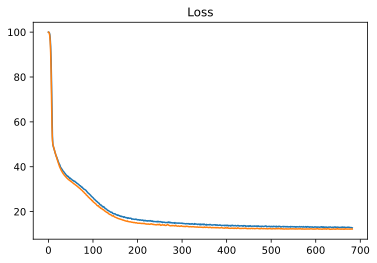

In [47]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show()

In [48]:
model.load_weights('best_model.hdf5')
model.save('nn_1.hdf5')

In [49]:
test_predict_nn1 = model.predict(X_test)
print(f"Mod3. Tab NN MAPE: {(mape(y_test, test_predict_nn1[:,0]))*100:0.2f}%")

Mod3. Tab NN MAPE: 12.23%


In [50]:
sub_predict_nn1 = model.predict(X_sub)
# sample_submission['price'] = np.exp(sub_predict_nn1[:,0])
sample_submission['price'] = sub_predict_nn1[:, 0]
sample_submission.to_csv('nn1_submission.csv', index=False)

# Model 4: NLP + Multiple Inputs

* создаем список 'стоп' слов
* очистим Description 
* разобьем текст на токены
* проводим лемматизацию

In [96]:
data.description = data_origin.description

In [97]:
data.description

0       Всем привет!\n\nПродам эксклюзивный проект 124...
1       Продаю любимейшую тачилу.. Обвес и тюнинг Hamm...
2       Машина тут продаётся не в первый раз, НО! Толь...
3       Автомобиль в отличном состоянии, весь в родной...
4       Немка! с бесключивым доступом и камерой заднег...
                              ...                        
8348    Продаётся любимый автомобиль! За годы эксплуат...
8349    Куплена у официального дилера в 2017 г. \n\nТр...
8350    Торг на месте. Все работает. Сборка немецкая. ...
8351    Автомобиль в отличном состоянии.\n3-из Авто в ...
8352    Удлиненный заводской Pullman на базе W140 (воо...
Name: description, Length: 8353, dtype: object

In [98]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stopwords = stopwords.words("russian")
from pymorphy2 import MorphAnalyzer
morph = MorphAnalyzer()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [99]:
# дополним список стоп-слов
sw = pd.read_csv('stopnew.txt')
stopwords = set(stopwords+sw['c'].tolist())

In [100]:
len(stopwords)

577

In [101]:
# функция очистки от английских букв, цифр и пр.,
# очистки от стоп-слов,
# лематизации, разбиения на токены
patterns = r"[A-Za-z0-9^\W]+"


def clear(doc):
    doc = re.sub(patterns, ' ', doc)
    tokens = []
    for token in doc.split():
        token = token.lower()
        if token and token not in stopwords:
            token = token.strip()
            token = morph.normal_forms(token)[0]
            tokens.append(token)
    return tokens

In [102]:
%%time
data.description = data.description.apply(clear)

CPU times: user 1min 54s, sys: 154 ms, total: 1min 54s
Wall time: 1min 54s


In [103]:
data.description

0       [продать, эксклюзивный, проект, универсал, мод...
1       [продавать, любимый, тачил, обвес, тюнинг, езд...
2       [продаваться, перебрать, двигатель, замена, ко...
3       [автомобиль, отличный, состояние, родный, крас...
4       [немка, бесключивый, доступ, камера, задний, в...
                              ...                        
8348    [продаваться, любимый, автомобиль, год, эксплу...
8349    [купить, официальный, дилер, владелец, владеле...
8350    [торг, место, работать, сборка, немецкий, рези...
8351    [автомобиль, отличный, состояние, авто, семья,...
8352    [удлинённый, заводский, база, правильно, завод...
Name: description, Length: 8353, dtype: object

Определим самые частотные слова в описании

In [104]:
from collections import defaultdict

In [105]:
word_freq = defaultdict(int)
for tokens in data.description.dropna():
    for token in tokens:
        word_freq[token] += 1

In [106]:
len(word_freq)

13448

In [107]:
max_freq = sorted(word_freq, key=word_freq.get, reverse=True)[:10]
max_freq

['автомобиль',
 'система',
 'пробег',
 'задний',
 'салон',
 'сидение',
 'состояние',
 'передний',
 'диск',
 'комплект']

In [108]:
# попытка удалить самые частотные слова к положительному результату не привела
def clear_max(l):
    b = []
    i = 0
    while i < len(l):
        if l[i] in max_freq:
            del l[i]
        else:
            i += 1
    return l

# data['description']=data['description'].apply(clear_max)

In [109]:
# split данных
text_train = data.description.iloc[X_train.index]
text_test = data.description.iloc[X_test.index]
text_sub = data.description.iloc[X_sub.index]

### Tokenizer

In [110]:
%%time
# The maximum number of words to be used. (most frequent)
MAX_WORDS = 100000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 256

tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

CPU times: user 464 ms, sys: 0 ns, total: 464 ms
Wall time: 466 ms


In [111]:
%%time
text_train_sequences = sequence.pad_sequences(
    tokenize.texts_to_sequences(text_train), maxlen=MAX_SEQUENCE_LENGTH)
text_test_sequences = sequence.pad_sequences(
    tokenize.texts_to_sequences(text_test), maxlen=MAX_SEQUENCE_LENGTH)
text_sub_sequences = sequence.pad_sequences(
    tokenize.texts_to_sequences(text_sub), maxlen=MAX_SEQUENCE_LENGTH)

print(text_train_sequences.shape,
      text_test_sequences.shape, text_sub_sequences.shape)

(6013, 256) (669, 256) (1671, 256)
CPU times: user 429 ms, sys: 0 ns, total: 429 ms
Wall time: 430 ms


In [112]:
print(text_train.iloc[100])
print(text_train_sequences[100])

['двигатель', 'собранный', 'настройка', 'бар', 'колёсный', 'сила', 'момент', 'блок', 'собранный', 'новый', 'поршень', 'расточить', 'блок', 'нанести', 'хон', 'подогнать', 'тепловой', 'зазор', 'сотка', 'доработать', 'масляный', 'насос', 'блок', 'собранный', 'новый', 'компонент', 'шатун', 'поршневой', 'развешать', 'подогнать', 'гбц', 'сток', 'коллектор', 'сварить', 'рейсбокс', 'специально', 'машина', 'турбин', 'турбина', 'масло', 'вестгейт', 'кпп', 'перебералася', 'усиленный', 'сцепление', 'проводка', 'мотор', 'новый', 'собрать', 'мозг', 'абит', 'мозг', 'абит', 'настроить', 'виктор', 'рейсбокс', 'датчик', 'подключить', 'мозг', 'датчик', 'температура', 'масло', 'антифриз', 'буста', 'форсунка', 'топливный', 'насос', 'литр', 'топливо', 'насос', 'двигатель', 'обратно', 'собрать', 'армированный', 'шланг', 'топливный', 'бак', 'сток', 'радиатор', 'охлаждение', 'алюминиевый', 'перенести', 'багажник', 'вентилятор', 'убрать', 'родный', 'тепло', 'обменник', 'установить', 'доп', 'радиатор', 'охлажден


###RNN NLP

In [113]:
model_nlp = Sequential()
model_nlp.add(L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"))
model_nlp.add(L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,))
model_nlp.add(L.LSTM(256, return_sequences=True))
model_nlp.add(L.Dropout(0.5))
model_nlp.add(L.LSTM(128,))
model_nlp.add(L.Dropout(0.45))
model_nlp.add(L.Dense(64, activation="relu"))
model_nlp.add(L.Dropout(0.25))

###MLP

In [114]:
model_mlp = Sequential()
model_mlp.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model_mlp.add(L.Dropout(0.6))
model_mlp.add(L.Dense(256, activation="relu"))
model_mlp.add(L.Dropout(0.3))

###Multiple Inputs NN

In [115]:
combinedInput = L.concatenate([model_nlp.output, model_mlp.output])

head = L.Dense(64, activation="relu")(combinedInput)
head = L.Dense(1, activation="linear")(head)

model = Model(inputs=[model_nlp.input, model_mlp.input], outputs=head)

In [72]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
seq_description (InputLayer)    [(None, 256)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 256, 256)     3442944     seq_description[0][0]            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 256, 256)     525312      embedding[0][0]                  
__________________________________________________________________________________________________
dropout_2 (Dropout)             (None, 256, 256)     0           lstm[0][0]                       
_______________________________________________________________________________________

###Fit

In [73]:
# политика на LR
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.01,
    decay_steps=10000,
    decay_rate=0.9)

optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
model.compile(loss='MAPE', optimizer=optimizer, metrics=['MAPE'])

In [74]:
checkpoint = ModelCheckpoint('best_model.hdf5', monitor=[
                             'val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', 
                          patience=10, restore_best_weights=True)
callbacks_list = [checkpoint, earlystop]

In [75]:
%%time
history = model.fit([text_train_sequences, X_train], y_train,
                    batch_size=512,
                    epochs=1000,
                    validation_data=([text_test_sequences, X_test], y_test),
                    callbacks=callbacks_list
                    )

Epoch 1/1000
12/12 [==============================] - 7s 587ms/step - loss: 99.9696 - MAPE: 99.9696 - val_loss: 99.7431 - val_MAPE: 99.7431
Epoch 2/1000
12/12 [==============================] - 6s 502ms/step - loss: 97.5568 - MAPE: 97.5568 - val_loss: 90.8133 - val_MAPE: 90.8133
Epoch 3/1000
12/12 [==============================] - 6s 494ms/step - loss: 71.2553 - MAPE: 71.2553 - val_loss: 50.9813 - val_MAPE: 50.9813
Epoch 4/1000
12/12 [==============================] - 6s 497ms/step - loss: 52.4510 - MAPE: 52.4510 - val_loss: 48.2041 - val_MAPE: 48.2041
Epoch 5/1000
12/12 [==============================] - 6s 488ms/step - loss: 47.3206 - MAPE: 47.3206 - val_loss: 45.1344 - val_MAPE: 45.1344
Epoch 6/1000
12/12 [==============================] - 6s 496ms/step - loss: 43.9918 - MAPE: 43.9918 - val_loss: 42.3312 - val_MAPE: 42.3312
Epoch 7/1000
12/12 [==============================] - 6s 494ms/step - loss: 41.3477 - MAPE: 41.3477 - val_loss: 39.5237 - val_MAPE: 39.5237
Epoch 8/1000
12/12 [

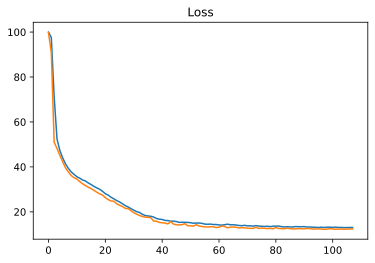

In [77]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [78]:
model.load_weights('best_model.hdf5')
model.save('nn_mlp_nlp.hdf5')

In [79]:
test_predict_nn2 = model.predict([text_test_sequences, X_test])
print(f"Model 4: NLP + Multiple Inputs MAPE: {(mape(y_test, test_predict_nn2[:,0]))*100:0.2f}%")

Model 4: NLP + Multiple Inputs MAPE: 12.46%


In [80]:
sub_predict_nn2 = model.predict([text_sub_sequences, X_sub])
sample_submission['price'] = sub_predict_nn2[:,0]
sample_submission['price'] = sample_submission['price'].apply(lambda x: round(x//1000)*1000)
sample_submission.to_csv('nn2_submission.csv', index=False)

##Model 5: Добавляем изображения

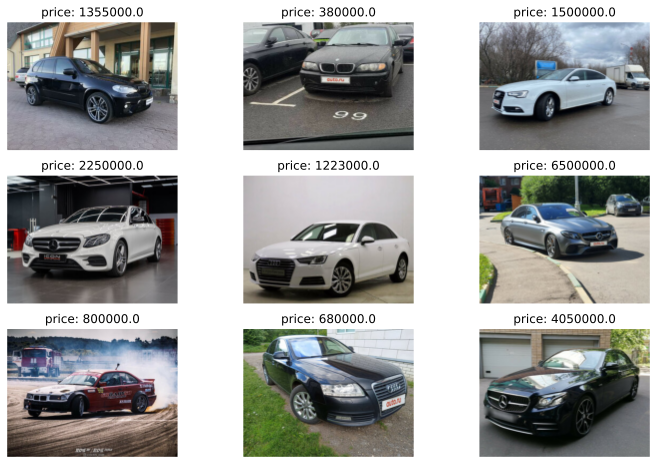

In [116]:
# проверяем загрузку цен и изображений
plt.figure(figsize=(12, 8))

random_image = train.sample(n=9)
random_image_paths = random_image['sell_id'].values
random_image_cat = random_image['price'].values

for index, path in enumerate(random_image_paths):
    im = PIL.Image.open('img/img/' + str(path) + '.jpg')
    plt.subplot(3, 3, index + 1)
    plt.imshow(im)
    plt.title('price: ' + str(random_image_cat[index]))
    plt.axis('off')
plt.show()

In [117]:
size = (320, 240)


def get_image_array(index):
    images_train = []
    for index, sell_id in enumerate(data['sell_id'].iloc[index].values):
        image = cv2.imread('img/img/' + str(sell_id) + '.jpg')
        assert(image is not None)
        image = cv2.resize(image, size)
        images_train.append(image)
    images_train = np.array(images_train)
    print('images shape', images_train.shape, 'dtype', images_train.dtype)
    return(images_train)


images_train = get_image_array(X_train.index)
images_test = get_image_array(X_test.index)
images_sub = get_image_array(X_sub.index)

images shape (6013, 240, 320, 3) dtype uint8
images shape (669, 240, 320, 3) dtype uint8
images shape (1671, 240, 320, 3) dtype uint8


###Albumentations

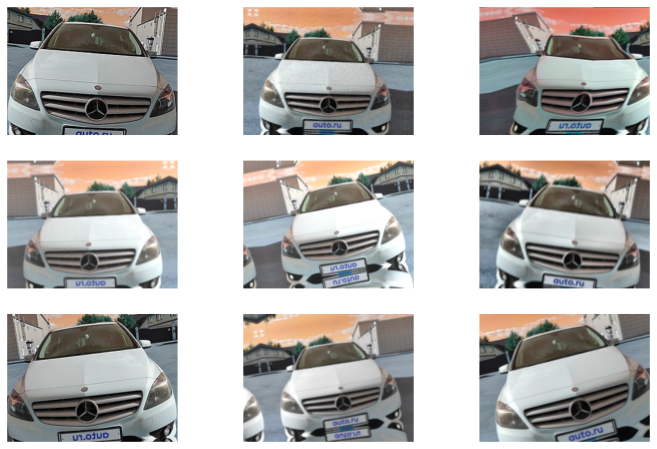

In [119]:
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose
)

augmentation = Compose([
    HorizontalFlip(),
    OneOf([
        IAAAdditiveGaussianNoise(),
        GaussNoise(),
    ], p=0.2),
    OneOf([
        MotionBlur(p=0.2),
        MedianBlur(blur_limit=3, p=0.1),
        Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2,
                     rotate_limit=15, p=1),
    OneOf([
        OpticalDistortion(p=0.3),
        GridDistortion(p=0.1),
        IAAPiecewiseAffine(p=0.3),
    ], p=0.2),
    OneOf([
        CLAHE(clip_limit=2),
        IAASharpen(),
        IAAEmboss(),
        RandomBrightnessContrast(),
    ], p=0.3),
    HueSaturationValue(p=0.3),
], p=1)

# пример
plt.figure(figsize=(12, 8))
for i in range(9):
    img = augmentation(image=images_train[0])['image']
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [120]:
def make_augmentations(images):
  print('применение аугментаций', end = '')
  augmented_images = np.empty(images.shape)
  for i in range(images.shape[0]):
    if i % 200 == 0:
      print('.', end = '')
    augment_dict = augmentation(image = images[i])
    augmented_image = augment_dict['image']
    augmented_images[i] = augmented_image
  print('')
  return augmented_images

In [133]:
# NLP part

In [125]:
data['description'] = data.description.apply(lambda x: ' '.join([str(i) for i in x]))

In [130]:
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

In [132]:
def process_image(image):
    return augmentation(image = image.numpy())['image']

def tokenize_(descriptions):
  return sequence.pad_sequences(tokenize.texts_to_sequences(descriptions), maxlen = MAX_SEQUENCE_LENGTH)

def tokenize_text(text):
    return tokenize_([text.numpy().decode('utf-8')])[0]

def tf_process_train_dataset_element(image, table_data, text, price):
    im_shape = image.shape
    [image,] = tf.py_function(process_image, [image], [tf.uint8])
    image.set_shape(im_shape)
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

def tf_process_val_dataset_element(image, table_data, text, price):
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

train_dataset = tf.data.Dataset.from_tensor_slices((
    images_train, X_train, data.description.iloc[X_train.index], y_train
    )).map(tf_process_train_dataset_element)

test_dataset = tf.data.Dataset.from_tensor_slices((
    images_test, X_test, data.description.iloc[X_test.index], y_test
    )).map(tf_process_val_dataset_element)

y_sub = np.zeros(len(X_sub))
sub_dataset = tf.data.Dataset.from_tensor_slices((
    images_sub, X_sub, data.description.iloc[X_sub.index], y_sub
    )).map(tf_process_val_dataset_element)

#проверяем, что нет ошибок (не будет выброшено исключение):
train_dataset.__iter__().__next__();
test_dataset.__iter__().__next__();
sub_dataset.__iter__().__next__();

###Строим сверточную сеть для анализа изображений без "головы"

In [151]:
#нормализация включена в состав модели EfficientNetB4, поэтому на вход она принимает данные типа uint8
efficientnet_model = tf.keras.applications.efficientnet.EfficientNetB3(weights = 'imagenet', include_top = False, input_shape = (size[1], size[0], 3))
efficientnet_output = L.GlobalAveragePooling2D()(efficientnet_model.output)

In [152]:
# строим нейросеть для анализа табличных данных
tabular_model = Sequential()
tabular_model.add(L.Dense(256, input_dim=X_train.shape[1], activation="relu"))
tabular_model.add(L.Dropout(0.2))
tabular_model.add(L.Dense(64, activation="relu"))
tabular_model.add(L.Dropout(0.2))


In [153]:
# NLP
nlp_model = Sequential()
nlp_model.add(L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"))
nlp_model.add(L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,))
nlp_model.add(L.LSTM(256, return_sequences=True))
nlp_model.add(L.Dropout(0.5))
nlp_model.add(L.LSTM(128,))
nlp_model.add(L.Dropout(0.45))
nlp_model.add(L.Dense(64, activation="relu"))
nlp_model.add(L.Dropout(0.25))

In [154]:
#объединяем выходы трех нейросетей
combinedInput = L.concatenate([efficientnet_output, tabular_model.output, nlp_model.output])

# being our regression head
head = L.Dense(256, activation="relu")(combinedInput)
head = L.Dense(1,)(head)

model = Model(inputs=[efficientnet_model.input, tabular_model.input, nlp_model.input], outputs=head)
model.summary()

Model: "functional_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 240, 320, 3) 0                                            
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, 240, 320, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
normalization_2 (Normalization) (None, 240, 320, 3)  7           rescaling_2[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 241, 321, 3)  0           normalization_2[0][0]            
_______________________________________________________________________________________

In [155]:
#добавляю политику на LR
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.005,
    decay_steps=10000,
    decay_rate=0.9)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
#optimizer = tf.keras.optimizers.Adam(0.005)

#компилирую модель
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [156]:
checkpoint = ModelCheckpoint('best_model.hdf5', monitor=['val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=10, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [ ]:
history = model.fit(train_dataset.batch(30),
                    epochs=100,
                    validation_data = test_dataset.batch(30),
                    callbacks=callbacks_list
                    )

Epoch 1/100
201/201 [==============================] - 358s 2s/step - loss: 59.8204 - MAPE: 59.8204 - val_loss: 39.0811 - val_MAPE: 39.0811
Epoch 2/100
201/201 [==============================] - 351s 2s/step - loss: 36.8254 - MAPE: 36.8254 - val_loss: 34.6334 - val_MAPE: 34.6334
Epoch 3/100
201/201 [==============================] - 353s 2s/step - loss: 32.9190 - MAPE: 32.9190 - val_loss: 31.6700 - val_MAPE: 31.6700
Epoch 4/100
201/201 [==============================] - 353s 2s/step - loss: 29.5178 - MAPE: 29.5178 - val_loss: 27.1281 - val_MAPE: 27.1281
Epoch 5/100
201/201 [==============================] - 352s 2s/step - loss: 25.5411 - MAPE: 25.5411 - val_loss: 24.9605 - val_MAPE: 24.9605
Epoch 6/100
201/201 [==============================] - 352s 2s/step - loss: 22.3381 - MAPE: 22.3381 - val_loss: 20.6088 - val_MAPE: 20.6088
Epoch 7/100
201/201 [==============================] - 351s 2s/step - loss: 19.7247 - MAPE: 19.7247 - val_loss: 18.2493 - val_MAPE: 18.2493
Epoch 8/100
201/201 

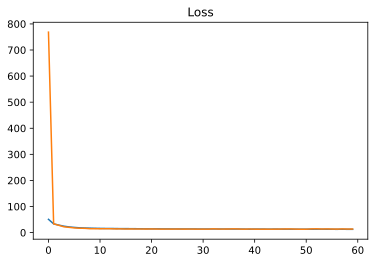

In [436]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [437]:
model.load_weights('best_model.hdf5')
model.save('nn_final.hdf5')

In [438]:
test_predict_nn3 = model.predict(test_dataset.batch(30))
print(f"Model 5: add images MAPE: {(mape(y_test, test_predict_nn3[:,0]))*100:0.2f}%")

Model 5: add images MAPE: 13.70%


# Blend

In [439]:
blend_predict = (test_predict_catboost + test_predict_nn3[:,0]) / 2
print(f"TEST mape: {(mape(y_test, blend_predict))*100:0.2f}%")

TEST mape: 12.29%


In [ ]:
# blend_sub_predict = (sub_predict_catboost + sub_predict_nn3[:,0]) / 2
# sample_submission['price'] = blend_sub_predict
# sample_submission.to_csv('blend_submission.csv', index=False)

##Итоги

Датасет очищен от дубликатов, пропущенных значений.
Подобраны новые переменные, выполнена нормализация и стандартизация признаков, применены методы для кодирования категориальных признаков.
Произведена генерация и отбор признаков.

Построена модель по обработке естественного языка (NLP)
Применены стандартные архитектуры.
Обработка текста: применены дополнительные методы предобработки (лемматизация)

В решение добавлены изображения
Примененf архитектурf EfficientNetB3
Обработка изображений: применены дополнительные методы предобработки (аугментация).

###Результат

Лучший результат был достигнут в Model 4: NLP + Multiple Inputs (12.46)

